## River Runoff Correlation in Washington State
#### Antonia Berndt
#### This project examines river flow (runoff) values for various stations across Washington State. Representative runoff stations with sufficient and reliable data are displayed within their respective watershed to visualize the spatial correlation of watersheds with each other.

CyberGIS Link: 

In [2]:
#Importing Modules
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from matplotlib import pyplot as plt
import seaborn as sb

### Data Source 1: Water Resource Inventory Areas (WRIA)
Downloaded from: https://geo.wa.gov/datasets/df827f607eb347d49a6cca071ce66d5e_11/explore

This data is sourced through Washington's Geospatial Open Data Portal. The shapefile provides an outline of the state and its major water resource inventory areas (i.e. watersheds). More information about how these boundaries were determined can be found here: https://geo.wa.gov/datasets/waecy::water-resource-inventory-areas-wria/about

In [4]:
#The WRIA shapefile is loaded into a geopandas dataframe as 'wria'
wria=gpd.read_file('WRIA.shp')

In [5]:
wria.describe

<bound method NDFrame.describe of     WRIA_NR               WRIA_NM  WRIA_ID    WRIA_AREA_  \
0        62          Pend Oreille        1  7.897900e+05   
1        61  Upper Lake Roosevelt        2  3.688261e+05   
2         1              Nooksack        3  1.036786e+06   
3        60                Kettle        4  6.564261e+05   
4        49              Okanogan        5  1.342477e+06   
..      ...                   ...      ...           ...   
57       28    Salmon - Washougal       62  3.169310e+05   
58        7             Snohomish       24  1.222291e+06   
59        8     Cedar - Sammamish       31  4.470858e+05   
60        9      Duwamish - Green       38  3.645308e+05   
61       10      Puyallup - White       44  6.732034e+05   

                                GlobalID         created_us created_da  \
0   2e9243dc-ffb5-4f1f-adc6-e1dbc845a9ae  WAECY_Geoservices 2024-06-30   
1   f365abb0-65a3-4611-bf97-1ba0c269e808  WAECY_Geoservices 2024-06-30   
2   02195eb7-fef4-457a-

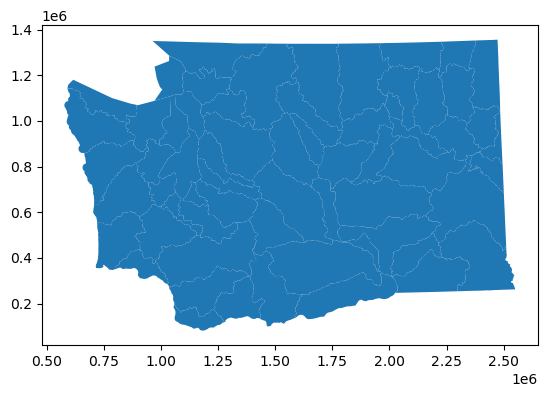

In [6]:
ax = wria.plot()

### Data Source 2: River Stream Search - Freshwater Information Network (FIN)¶

Downloaded from: https://apps.ecology.wa.gov/eim/search/SMP/RiverStreamSearch.aspx?MPLocationMPID=4



The Washington State Department of Ecology provides data for river/stream locations throughout the state in csv format. These datasets provide a large variety of information related to river flow, water quality, temperature, turbidity, and more. They also vary in the amount of time that their measurements cover. For the purpose of this project, only stations with long term and continuous runoff data (at least circa 500 flow measurements) spanning a minimum of four decades were considered. The initial selection of stations to include in this analysis was performed manually using the overview site provided here: https://apps.ecology.wa.gov/eim/search/SMP/RiverStreamSingleStationOverview.aspx?LocationUserIds=05B110&ResultType=RiverStreamOverviewList

Flow is provided in cubic feet per second (cfs), which represents the volume of water passing through a section of a stream at a particular time. Because of this, cfs can vary based on where on a river the measurement is taken. Cfs is defined by usgs.gov as "A unit expressing rates of discharge. One cubic foot per second is equal to the discharge of a stream of rectangular cross section, 1 foot wide and 1 foot deep, flowing water an average velocity of 1 foot per second." (https://water.usgs.gov/wsc/glossary.html#Cubicfeetpersecond)

When requesting data from the FIN, all watersheds were selected. However, the download portal limits the amount of data that may be requested at one time. For this reason, data was requested in two separate orders based on Monitoring Region: one for Northwest and Southwest WA, and one for Central and Eastern WA. The request was filtered further by setting the Location Status to "Active" and the Location Setting to "Long-term".

Data from these runoff stations were imported, filtered, and analyzed further within this project. A full overview of the stations that were finally selected to represent each watershed is provided below.

In [8]:
#Reading in the River Stream Results csv for eastern and western WA as pandas dataframes.
east=pd.read_csv('RiverStreamResults_2024Jul27_200373.csv') #Central & East WA
west=pd.read_csv('RiverStreamResults_2024Jul29_275611.csv') #Northwest & Southwest WA

C:\Users\anton\AppData\Local\Temp\ipykernel_16808\1576623742.py:2: DtypeWarning: Columns (6,13,15,16,19,21,24,30,31,32,33,37,38,40,43,50,52,58,59,65,83) have mixed types. Specify dtype option on import or set low_memory=False.
  east=pd.read_csv('RiverStreamResults_2024Jul27_200373.csv') #Central & East WA
C:\Users\anton\AppData\Local\Temp\ipykernel_16808\1576623742.py:3: DtypeWarning: Columns (6,21,24,43,46,50,52,58,65,67,83) have mixed types. Specify dtype option on import or set low_memory=False.
  west=pd.read_csv('RiverStreamResults_2024Jul29_275611.csv') #Northwest & Southwest WA


In [9]:
riv=pd.concat([west,east], ignore_index=True) #Concatenating West and East data into one dataframe

In [10]:
#The River Stream Location Details provides more information about each station, including a description of their location.
#River details are read in for East and West, then concatenated.
eastDetails=pd.read_csv('RiverStreamLocationDetails_2024Jul27_24.csv') #Central & East WA
westDetails=pd.read_csv('RiverStreamLocationDetails_2024Jul29_35.csv') #Northwest & Southwest WA

In [11]:
rivDetails=pd.concat([westDetails,eastDetails], ignore_index=True)
rivDetails

,Location_ID,Location_Name,Location_Setting_Description,Location_Description,Ecology_Facility_Site_ID,Is_Location_a_Well,Address,City,State,Zip_Code,...,Elevation_Accuracy,Elevation_Collecton_Method,Sediment_Elevation_Elevation_Reference,Location_Suspect_or_Rejected_Flag,Location_Suspect_Code,Location_Suspect_Description,Location_ID_Alias,Associated_Study_ID,Record_Created_On,Location_System_ID
0,10A070,PUYALLUP RIVER AT MERIDIAN ST,"Channeled, flowing water",LOCATED AT THE BRIDGE IMMEDIATELY NORTH OF PUY...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0007, AJOH0029, AMS001, AMS001, AMS001-2, ...",1/1/1753 12:00:00 AM,3063040
1,09A190,GREEN RIVER AT KANASKAT,"Channeled, flowing water",LOCATED AT THE CUMBERLAND-PALMER ROAD BRIDGE A...,NaN,N,NaN,NaN,WA,NaN,...,+/- 10 ft (3 m),Digital elevation model (DEM) - source unspeci...,NaN,NaN,NaN,NaN,NaN,"AJOH0007, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,2043040
2,09A080,GREEN RIVER AT TUKWILA,"Channeled, flowing water",LOCATED AT THE INTERSECTION ON INTERURBAN AVEN...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0007, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,6023040
3,20B070,HOH RIVER AT DNR CAMPGROUND,"Channeled, flowing water",LOCATED AT THE BANK IN THE DEPARTMENT OF NATUR...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,3494040
4,26B070,COWLITZ RIVER AT KELSO,"Channeled, flowing water",LOCATED IN KELSO AT THE ALLEN (MAIN) STREET BR...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,6242320
5,05A070,STILLAGUAMISH RIVER NEAR SILVANA,"Channeled, flowing water",LOCATED ON THE INTERSTATE 5 BRIDGE JUST NORTH ...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,4560040
6,08C110,CEDAR RIVER NEAR LANDSBURG,"Channeled, flowing water",Located 100 ft. downstream of the former Trude...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,2492040
7,27D090,EAST FORK LEWIS RIVER NEAR DOLLAR CORNER,"Channeled, flowing water","LOCATED AT THE LEWIS RIVER BOTTOM ROAD BRIDGE,...",NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,3132140
8,05B110,NORTH FORK STILLAGUAMISH NEAR DARRINGTON,"Channeled, flowing water",LOCATED .9 MILES NORTH OF HIGHWAY 530 AND WHIT...,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AJOH0029, AMS001, AMS001, AMS001-2, AMS001-2, ...",1/1/1753 12:00:00 AM,4181040
9,20E100,TWIN CREEK AT UPPER HOH RD BRIDGE,"Channeled, flowing water",Hwy 101 to Upper Hoh Rd to Twin Creek bridge,NaN,N,NaN,NaN,WA,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"AMS001, AMS001, AMS001-2, AMS001-2",12/9/2010 11:03:29 AM,94635442


In [12]:
#The riv dataset includes a variety of measurements. For this project, we filter out all data except that for river flow.
riv=riv[riv['Result_Parameter_Name']=='Flow'] 

In [13]:
#Creating a 'stations' dataframe. This drops duplicates from riv to show the Location_ID, Location Name and Lat/Lon of the individual stations.
stations=riv[['Location_ID','Location_Name','Calculated_Latitude_Decimal_Degrees_NAD83HARN','Calculated_Longitude_Decimal_Degrees_NAD83HARN']].drop_duplicates()
stations=stations.sort_values(by='Location_ID')
stations

,Location_ID,Location_Name,Calculated_Latitude_Decimal_Degrees_NAD83HARN,Calculated_Longitude_Decimal_Degrees_NAD83HARN
78,01A050,NOOKSACK RIVER AND BRENNAN,48.818889,-122.580000
360,01A120,NOOKSACK R @ NO CEDARVILLE,48.841670,-122.293050
66157,01A120,NOOKSACK RIVER AT NORTH CEDARVILLE,48.841670,-122.293050
45,03A060,SKAGIT RIVER NEAR MOUNT VERNON,48.444833,-122.335451
133,03B050,SAMISH RIVER NEAR BURLINGTON,48.545823,-122.338124
17,04A100,SKAGIT RIVER AT MARBLEMOUNT,48.526230,-121.429020
335,05A070,STILLAGUAMISH RIVER NEAR SILVANA,48.196782,-122.210067
339,05A090,SOUTH FORK STILLAGUAMISH AT ARLINGTON,48.200660,-122.119030
23,05A110,S. FORK STILLY NEAR GRANITE FALLS,48.103160,-121.953190
66161,05A110,SOUTH FORK STILLY NEAR GRANITE FALLS,48.103160,-121.953190


In [14]:
#Based on a manual audit within the FIN portal, certain stations did not meet criteria for long-term flow data. These are dropped here.
#More details regarding how these were selected can be found in the data description above and in the project report.
to_drop=['03B050','05A090','05A110','05B110','07C070','07D050','09A080','16C090','24F070','27D090','34A170','37A205','48A075','49A070']
stations=stations[~stations['Location_ID'].isin(to_drop)] #~ flips a True statement to False, meaning we keep any rows that are not in the to_drop list.
stations=stations.drop([360,343]) #These stations were missed in the previous drop_duplicates function.
stations

,Location_ID,Location_Name,Calculated_Latitude_Decimal_Degrees_NAD83HARN,Calculated_Longitude_Decimal_Degrees_NAD83HARN
78,01A050,NOOKSACK RIVER AND BRENNAN,48.818889,-122.580000
66157,01A120,NOOKSACK RIVER AT NORTH CEDARVILLE,48.841670,-122.293050
45,03A060,SKAGIT RIVER NEAR MOUNT VERNON,48.444833,-122.335451
17,04A100,SKAGIT RIVER AT MARBLEMOUNT,48.526230,-121.429020
335,05A070,STILLAGUAMISH RIVER NEAR SILVANA,48.196782,-122.210067
66173,05B070,NORTH FORK STILLAGUAMISH AT CICERO,48.267880,-122.013470
51,07A090,SNOHOMISH RIVER AT SNOHOMISH,47.910370,-122.099020
277,07D130,SNOQUALMIE RIVER AT SNOQUALMIE,47.527600,-121.812330
12,08C070,CEDAR RIVER AT LOGAN ST/RENTON,47.485655,-122.209010
5,08C110,CEDAR RIVER NEAR LANDSBURG,47.391045,-121.920663


In [15]:
print ('Total number of stations: ' + str(len(stations)))

Total number of stations: 42


In [16]:
#The stations dataset was transformed into a geopandas dataframe based on their latitude and longitude.
stations=gpd.GeoDataFrame(stations, geometry=gpd.points_from_xy(stations.Calculated_Longitude_Decimal_Degrees_NAD83HARN, 
                                                           stations.Calculated_Latitude_Decimal_Degrees_NAD83HARN))

In [17]:
#The sortdata function is defined here. This prepares the data in the riv dataframe for analysis. 
def sortdata(loc):
    stations=riv[riv['Location_ID']==loc] #The station is defined by Location ID and selected from the riv dataframe
    stations=stations[['Field_Collection_Start_Date','Result_Value']]
    #Only the start date and measurement result of the measurement are of interest. Almost all measurements start and end on the same day
    stations['Field_Collection_Start_Date']=pd.to_datetime(stations['Field_Collection_Start_Date']) #Start date data is transformed to datetime type
    stations=stations.sort_values(by='Field_Collection_Start_Date') 
    stations=stations.set_index('Field_Collection_Start_Date') #Measurements are sorted chronologically and date is set as the index
    stations=stations.rename(columns={'Result_Value':str(loc)}) #The Result column is renamed based on the location ID
    stations=stations.resample('ME').mean() #Most stations only have one or two monthly values. 
    #The resample function groups measurements by month to determine the monthly mean. This allows for easier comparison with monthly runoff at other stations
    return stations

In [18]:
#This for loop runs each station in the stations list through the sort data function
dict={} #All flow dataframes for each station will be collected within this dictionary
for x in list(stations['Location_ID']):
    dict[f's{x}'] = sortdata(x)

In [19]:
#The coordinate reference systems for both geopandas dataframes are set to WGS84 (4326) so they can be plotted together.
stations=stations.set_crs('4326')
wria=wria.to_crs('4326')

C:\Users\anton\AppData\Local\Temp\ipykernel_16808\3040242645.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  for x, y, label in zip(wria.geometry.centroid.x, wria.geometry.centroid.y, wria['WRIA_NM']):


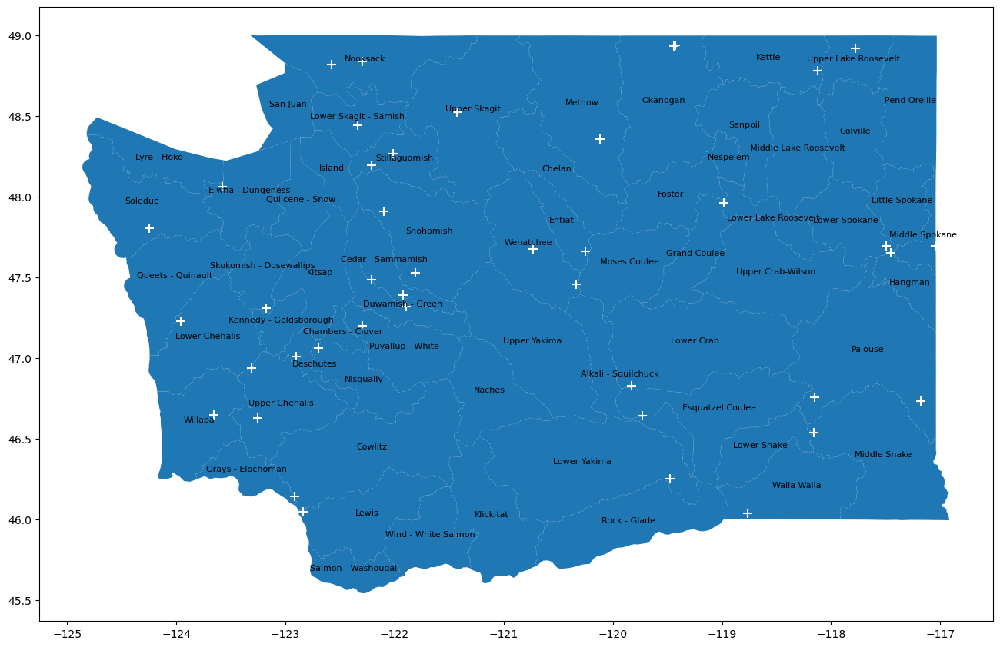

In [20]:
map = wria.plot(figsize=(16, 12), label='WRIA_NM')
stations.plot(ax=map, marker='+', color='white',markersize=80)
for x, y, label in zip(wria.geometry.centroid.x, wria.geometry.centroid.y, wria['WRIA_NM']):
    map.annotate(label, xy=(x, y), fontsize=8, ha='center') #Plotting annotations for each WRIA
plt.show()
#This plot shows the locations of runoff measurement stations throughout WA with white markers.

The above plot shows the selected stations with sufficient data and their placement within Washington's WRIA. We see that some watersheds do not have any measurements stations, while others have multiple. 

Below, the runoff timeseries of several stations are plotted along with other's within the same watershed. This serves two purposes.
- We can select one representative station for each watershed for further analysis. This selection is primarily based on which station has longer and greater runoff data as this can show more variation and is likely the most representative of the area.
- The runoff time series provides a better understanding of what our runoff data looks like. We can visually identify the seasonal cycles in runoff and correlation with runoff at nearby stations. For almost all stations (including those not shown in these examples) we can rely on continuous data from the late 1970s onwards.

Text(0.5, 1.0, 'Snohomish')

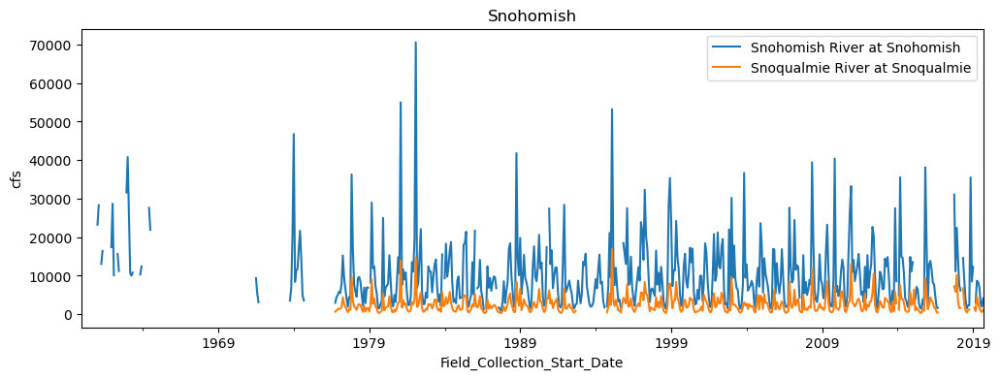

In [22]:
plt.figure(figsize=(12,4))
dict['s07A090']['07A090'].plot(label='Snohomish River at Snohomish')
dict['s07D130']['07D130'].plot(label='Snoqualmie River at Snoqualmie')
plt.legend()
plt.ylabel('cfs')
plt.title('Snohomish')
#Selecting the station at Snohomish to represent runoff as Snoqualmie River has lower runoff values and more gaps.

Text(0.5, 1.0, 'Upper Chehalis')

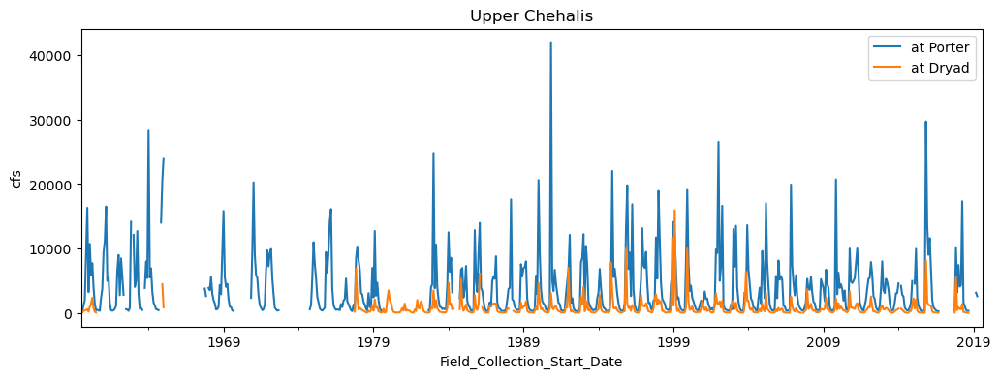

In [23]:
plt.figure(figsize=(12,4))
dict['s23A070']['23A070'].plot(label='at Porter')
dict['s23A160']['23A160'].plot(label='at Dryad')
plt.legend()
plt.ylabel('cfs')
plt.title('Upper Chehalis')
#Selecting the runoff at Porter to represent the Upper Chehalis watershed as it has a longer runoff series than that at Dryad.

Text(0.5, 1.0, 'Wenatchee')

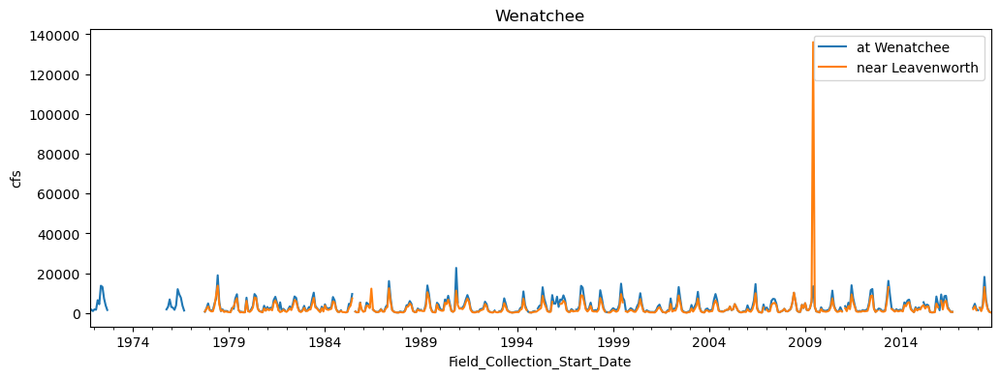

In [24]:
plt.figure(figsize=(12,4))
dict['s45A070']['45A070'].plot(label='at Wenatchee')
dict['s45A110']['45A110'].plot(label='near Leavenworth')
plt.legend()
plt.ylabel('cfs')
plt.title('Wenatchee')
#The runoff stations for the Wenatchee River do show impressive visual correlation with each other. 
#We can assume that the extreme runoff value at Leavenworth is likely erroneous; therefore, the Wenatchee station may be more reliable.

In [25]:
#For all other WRIAs that had more than one station, these were compared in a similar fashion to select one representative for that WRIA.
#The remaining stations are dropped here
to_drop=['01A050','05B070','07D130','08C110','23A160','34B110','45A110','49A190']
stations=stations[~stations['Location_ID'].isin(to_drop)] 
stations

,Location_ID,Location_Name,Calculated_Latitude_Decimal_Degrees_NAD83HARN,Calculated_Longitude_Decimal_Degrees_NAD83HARN,geometry
66157,01A120,NOOKSACK RIVER AT NORTH CEDARVILLE,48.841670,-122.293050,POINT (-122.29305 48.84167)
45,03A060,SKAGIT RIVER NEAR MOUNT VERNON,48.444833,-122.335451,POINT (-122.33545 48.44483)
17,04A100,SKAGIT RIVER AT MARBLEMOUNT,48.526230,-121.429020,POINT (-121.42902 48.52623)
335,05A070,STILLAGUAMISH RIVER NEAR SILVANA,48.196782,-122.210067,POINT (-122.21007 48.19678)
51,07A090,SNOHOMISH RIVER AT SNOHOMISH,47.910370,-122.099020,POINT (-122.09902 47.91037)
12,08C070,CEDAR RIVER AT LOGAN ST/RENTON,47.485655,-122.209010,POINT (-122.20901 47.48566)
36,09A190,GREEN RIVER AT KANASKAT,47.319274,-121.893737,POINT (-121.89374 47.31927)
265,10A070,PUYALLUP RIVER AT MERIDIAN ST,47.202600,-122.293730,POINT (-122.29373 47.2026)
72,11A070,NISQUALLY RIVER AT NISQUALLY,47.061760,-122.696240,POINT (-122.69624 47.06176)
187,13A060,DESCHUTES RIVER AT EAST ST BRIDGE,47.011698,-122.903513,POINT (-122.90351 47.0117)


### Representative Runoff Stations

#### Nooksack
01A120 at North Cedarville

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=4064770

#### Lower Skagit-Samish
03A060 Skagit River near Mt Vernon

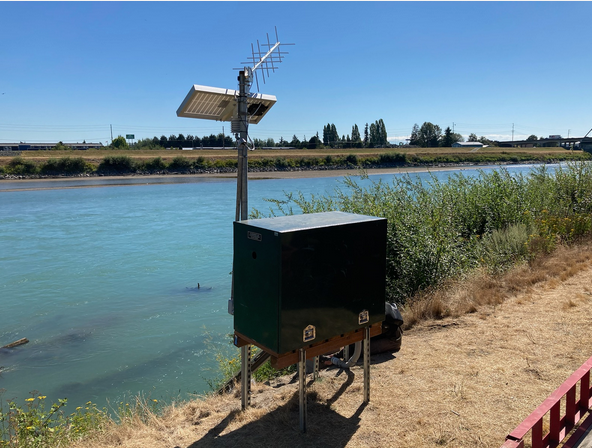

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=6515940


#### Upper Skagit
04A100 Skagit River at Marblemount

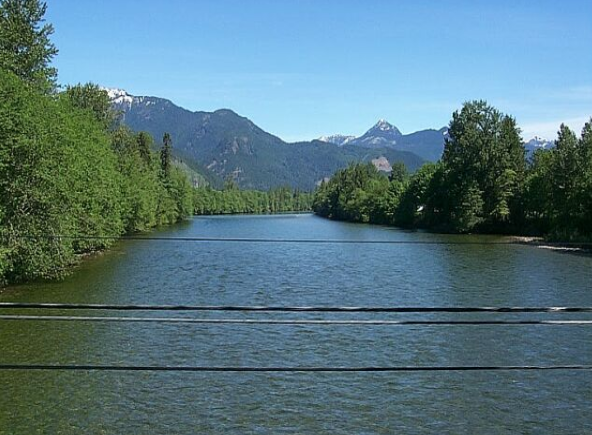

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8030040

#### Stillaguamish
05A070 Stillaguamish River near Silvana

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=4560040

#### Snohomish
07A090 Snohomish at Snohomish

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=9591040

#### Cedar-Sammamish
08C070 Cedar River at Logan St/Renton

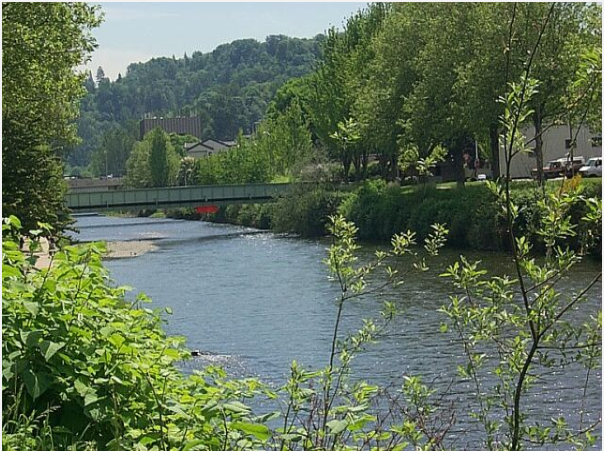

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=5262040


#### Duwamish-Green
09A190 Green River at Kanaskat

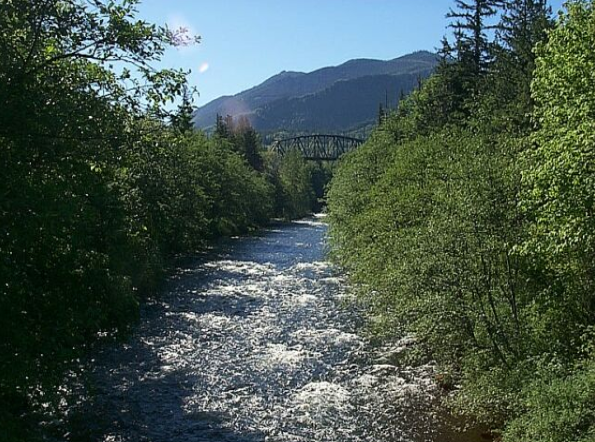

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=2043040

#### Puyallup-White
10A070 Puyallup River at Meridian St

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=3063040

#### Nisqually
11A070 Nisqually River at Nisqually

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=3383040

#### Deschutes
13A060 Deschutes River at East St Bridge

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8104040

#### Skokomish-Dosewallips
16A070 Skokomish River near Potlach

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=2333320

#### Elwah-Dungeness
18B070 Elwah River near Port Angeles

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=174040

#### Soleduck-Hoh
20B070 Hoh River at DNR Campground

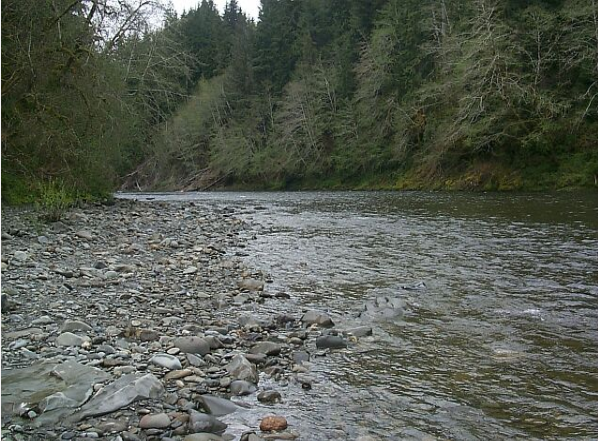

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=3494040

#### Lower Chehalis
22A070 Humptulips River near Humptulips

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=115040

#### Upper Chehalis
23A070 Chehalis river at Porter

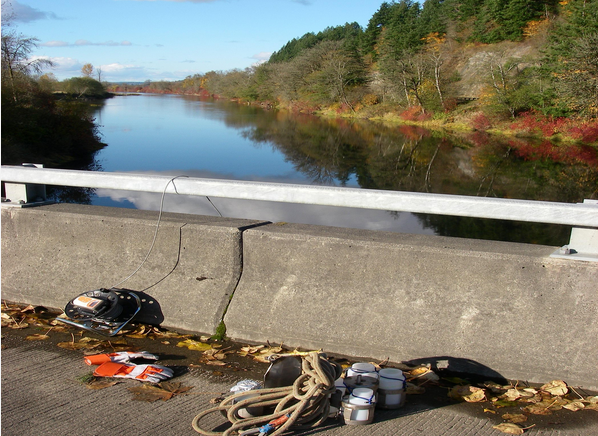

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=1435040

#### Willipa
24B090 Willapa River near 

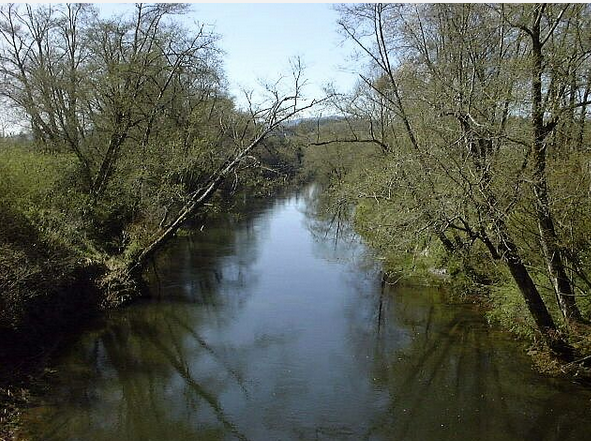

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=7275040

#### Cowlitz 
26B070 Cowlitz River at Kelso

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=6242320

#### Lewis
27B070 Kalama River near Kalama

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=102140

#### Walla Walla
32A070 Walla Walla River near Touchet

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=2053640

#### Palouse
34A070 Palouse River at Hooper

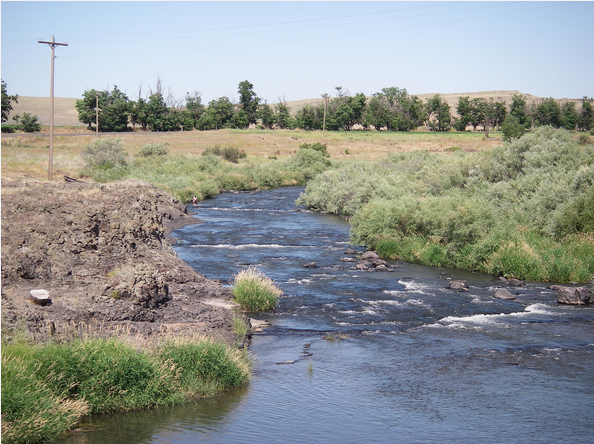

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8483640

#### Middle Snake
35B060 Tuannon River at Powers

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=364640

#### Alkali-Squilchuck
36A070 Columbia River near Vernita

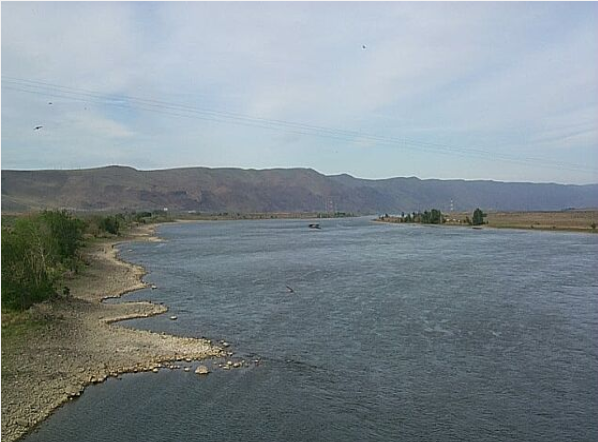

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8175021

#### Lower Yakima
37A090 Yakima River at Kiona

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=5184640

#### Lower Crab
41A070 Crab Creek near Beverly

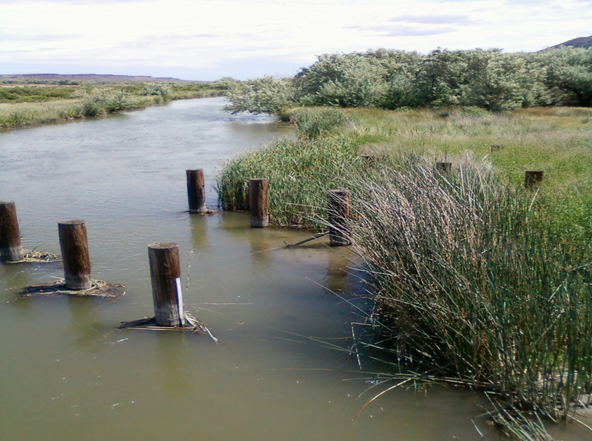

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8355640

#### Wenatchee
45A070 Wenatchee river at Wenatchee

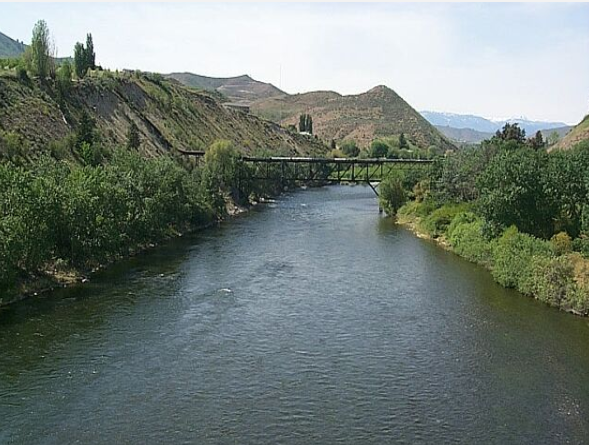

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=4295640

#### Entiat
46A070 Entiat River near Entiat

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=7060740

#### Methow
48A140 Methow River at Twisp

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=3180740

#### Okanogan
49B070 Similkameen River at Oroville

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=1431740

#### Grand Coulee
53A070 Columbia River at Grand Coulee

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=4485021

#### Lower Spokane
54A120 Spokane River at Riverside State Park

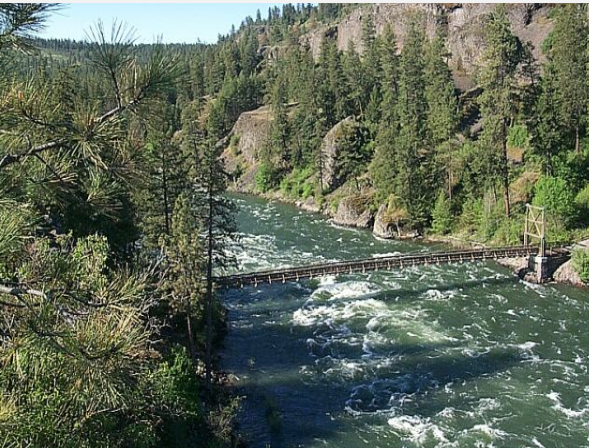

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=3351740

#### Hangman
56A070 Hangman Creek at Mouth

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=1102740

#### Middle Spokane
57A150 Spokane River at Stateline Bridge

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=222740

#### Kettle
60A070 Kettle River near Barstow

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=1242740

#### Upper Lake Roosevelt
61A070 Columbia River at Northport

https://apps.ecology.wa.gov/eim/search/Detail/Detail.aspx?DetailType=Location&SystemStationId=8083320



##### No station provides enough data to represent these WRIAs:
- San Juan
- Chambers-Clover
- Quilcene Snow
- Lyre-Hoko
- Queets-Quinault
- Grays-Elochoman
- Salmon-Washougal
- Wind-White Salmon
- Klickitat
- Rock Glade
- Lower Snake
- Esquatzel-Coulee
- Lower Yakima
- Naches
- Upper Crab-Wilson
- Moses-Coulee
- Chelan
- Foster
- Nespelem
- Sanpoil
- Lower Lake Roosevelt
- Middle Lake Roosevelt
- Colville
- Pend-Oreille



Pictures are sourced via this search function: https://apps.ecology.wa.gov/eim/search/SMP/RiverStreamSingleStationOverview.aspx?FocusTab=True&ResultType=RiverStreamOverviewList&RiverStreamSearchResults&LocationUserIds=05B110&LocationUserIdSearchType=Equals&LocationUserIDAliasSearchFlag=True

In [28]:
#The sortdata function is run again on all remaining stations for further analysis
dict={}
for x in list(stations['Location_ID']):
    dict[f's{x}'] = sortdata(x)

In [29]:
print ('Total number of stations: ' + str(len(stations)))

Total number of stations: 34


### Correlation Analysis

In [31]:
dict
#In order to run a correlation matrix among all stations in the dictionary, their dataframes need to be concatenated.

{'s01A120':                              01A120
 Field_Collection_Start_Date        
 1959-07-31                   4000.0
 1959-08-31                      NaN
 1959-09-30                      NaN
 1959-10-31                      NaN
 1959-11-30                   9617.0
 ...                             ...
 2019-05-31                     14.0
 2019-06-30                      NaN
 2019-07-31                     13.0
 2019-08-31                     18.0
 2019-09-30                     11.0
 
 [723 rows x 1 columns],
 's03A060':                               03A060
 Field_Collection_Start_Date         
 1947-09-30                    6360.0
 1947-10-31                       NaN
 1947-11-30                       NaN
 1947-12-31                       NaN
 1948-01-31                       NaN
 ...                              ...
 2019-05-31                   12300.0
 2019-06-30                   17400.0
 2019-07-31                    8510.0
 2019-08-31                    7430.0
 2019-09-30   

In [32]:
runoff=pd.concat(dict, axis=1)

In [33]:
runoff.columns=list(dict.keys()) #This resets their column name to represent the stations
runoff
#Because of the previous groupby month function, the monthly averages are compared for each station.
#NaNs represent months where certain stations did not have any measurements available. These will not be considered for the correlation.

,s01A120,s03A060,s04A100,s05A070,s07A090,s08C070,s09A190,s10A070,s11A070,s13A060,...,s45A070,s46A070,s48A140,s49B070,s53A070,s54A120,s56A070,s57A150,s60A070,s61A070
Field_Collection_Start_Date,,,,,,,,,,,,,,,,,,,,,
1947-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1947-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1947-08-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1947-09-30,NaN,6360.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1947-10-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-05-31,14.0,12300.0,5440.0,NaN,8400.0,374.0,NaN,3000.0,641.0,178.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-06-30,NaN,17400.0,5650.0,NaN,6960.0,338.0,NaN,3180.0,534.0,102.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-07-31,13.0,8510.0,3130.0,NaN,2710.0,NaN,NaN,1860.0,540.0,117.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

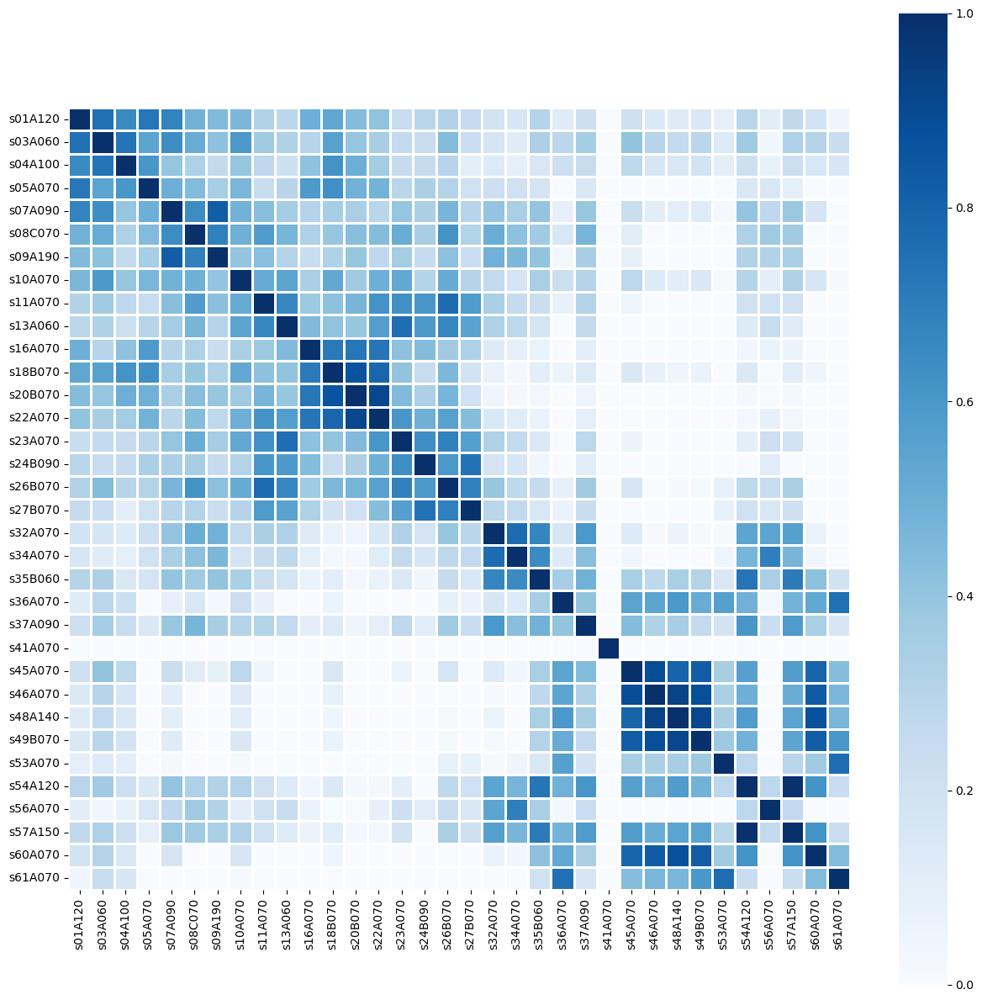

In [34]:
#Running a seaborn correlation matrix on all runoff data
plt.figure(figsize=(15,15))
sb.heatmap(runoff.corr(), annot=False, fmt=".2f", cmap='Blues', vmin=0, vmax=1, square=True,linewidth=1)

The correlation coefficient is a simple statistical measurement that describes the linear relationship between two variables, i.e. the relationship between all runoff measurements at one station with those at another. While it can be used to represent a relationship, correlation alone cannot indicate cause and effect. According to the pandas documentation of DataFrame.corr, the corr function, "compute[s] pairwise correlation of columns, excluding NA/null values." https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.corr.html

The Seaborn correlation matrix plots the correlation of all stations with all other stations using a heatmap. The diagonal line of 1.0 correlation values are to be expected as they represent the correlation of a station with itself. Since stations are numbered in a semi-spatial order, we can recognize higher correlation with "nearby" stations. 

The next steps incorporate this information into our WRIA plot to better visualize this spatial correlation.

In [36]:
#Creating a new geopandas dataframe from wria that only includes those watersheds that have runoff data (and thereby, correlation data) available
wria_corr=wria
nrs=[1,3,4,5,7,8,9,10,11,13,16,18,20,22,23,24,26,27,32,34,35,36,37,41,45,46,48,49,53,54,56,57,60,61]
wria_corr=wria_corr[wria_corr['WRIA_NR'].isin(nrs)]
wria_corr=wria_corr.sort_values(by='WRIA_NR')

Text(0.5, 1.0, 'Correlation of Monthly Runoff Values with Station 01A120')

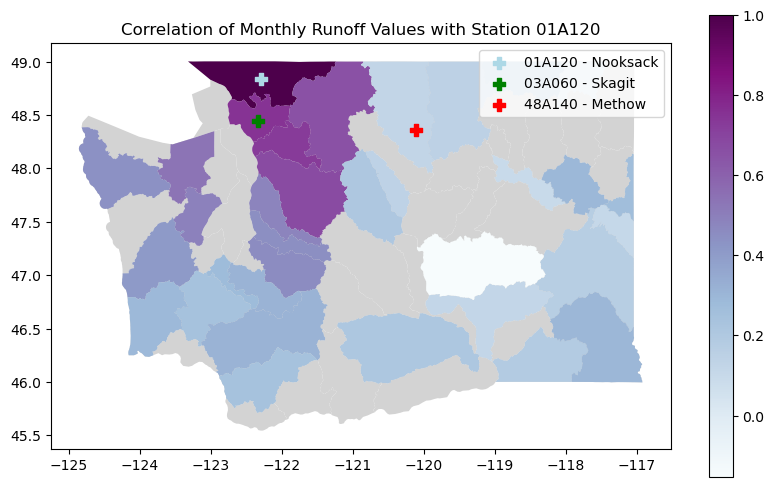

In [37]:
#This corrwith function calculates correlation for the station 01A120 with all other stations in the dataframe
corr=runoff.corrwith(runoff['s01A120'])
wria_corr['Correlation']=corr.values

#Plotting the correlation as a cloropleth
fig, ax = plt.subplots(figsize=(10, 6)) 
wria.plot(ax=ax, color='lightgrey')
wria_corr.plot(wria_corr['Correlation'], ax=ax, cmap='BuPu', legend=True)
stations[stations['Location_ID']=='01A120'].plot(ax=ax, marker='P', color='lightblue',markersize=80, label='01A120 - Nooksack')
stations[stations['Location_ID']=='03A060'].plot(ax=ax, marker='P', color='green',markersize=80, label='03A060 - Skagit')
stations[stations['Location_ID']=='48A140'].plot(ax=ax, marker='P', color='red',markersize=80, label='48A140 - Methow')
plt.legend()
plt.title('Correlation of Monthly Runoff Values with Station 01A120')

Text(0.5, 1.0, 'Runoff')

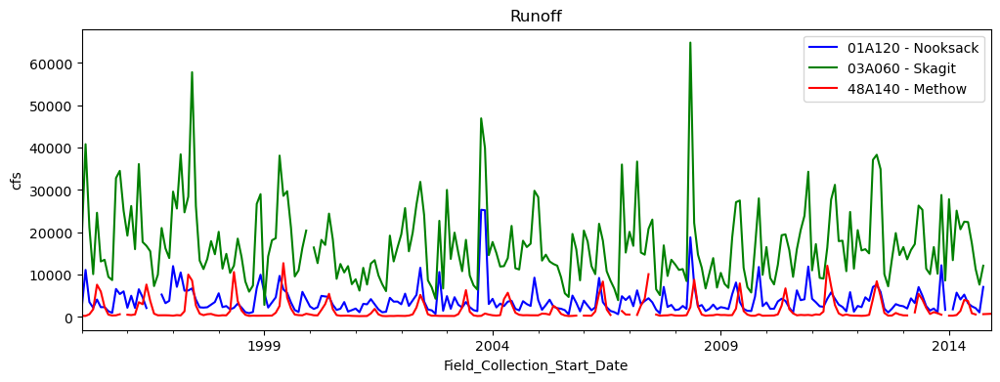

In [38]:
#Let's look at a 10 year time series for runoff at the Nooksack and Skagit rivers, which have a high correlation...
plt.figure(figsize=(12,4))
runoff['s01A120'].loc[((runoff.index >= '1995-01-01') & (runoff.index < '2015-01-01'))].plot(label='01A120 - Nooksack', color='blue')
runoff['s03A060'].loc[((runoff.index >= '1995-01-01') & (runoff.index < '2015-01-01'))].plot(label='03A060 - Skagit', color='green')
#vs. the Methow River, which has a low correlation with the Nooksack
runoff['s48A140'].loc[((runoff.index >= '1995-01-01') & (runoff.index < '2015-01-01'))].plot(label='48A140 - Methow', color='red')
plt.legend()
plt.ylabel('cfs')
plt.title('Runoff')

In [39]:
#Defining the stationcorr function, which produces a cloropleth map of correlation for a given station
def stationcorr(s):
    corr=runoff.corrwith(runoff[s]) #The corrwith function is run on the given station label,
    wria_corr['Correlation']=corr.values #which is used to redefine the 'Correlation' column of the wria geopandas dataframe
    fig, ax = plt.subplots(figsize=(10, 6)) #A plot is set up to plot the Correlation values
    wria.plot(ax=ax, color='lightgrey') #This plots the original wria with all stations underneath the cloropleth. 
    #Those WRIAs without runoff data will be grey.
    wria_corr.plot(wria_corr['Correlation'], ax=ax, cmap='BuPu', legend=True)
    m=s[1:] #This marks the location of the station for correlation
    stations[stations['Location_ID']==m].plot(ax=ax, marker='+', color='white',markersize=80)
    plt.title('Correlation of Monthly Runoff Values with Station '+m)
    return plt

Now, any station name can be entered into the stationcorr() function to create a correlation cloropleth across Washington.

The WRIAs provide a suitable area to visualize the spatial correlation between runoff measurement stations. However, within this project each WRIA is only represented by a single station within it's bounds. Because of the nature of rivers and flow measurements, runoff data and the derived correlation is highly variable and cannot be considered uniform across all WRIAs.

<module 'matplotlib.pyplot' from 'C:\\Users\\anton\\anaconda3\\Lib\\site-packages\\matplotlib\\pyplot.py'>

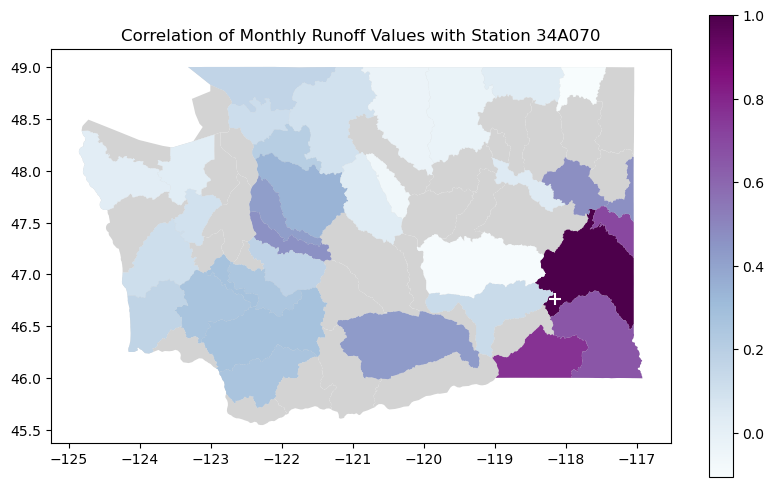

In [41]:
stationcorr('s34A070')

Station 41A070 (Crab Creek near Beverly) is notable in that it shows extremely low and the only negative correlation with other stations across the state. This is seen both in the seaborn heatmap as well as in the cloropleths.

The reason for this lack of correlation is not immediately clear. However, when we plot this runoff with the runoff in the Columbia River, which is one of Washington's major rivers and immediately south of station 41A070, we see that the river flow at Lower Crab is neglible to that of the nearby station. Additionally, Crab Creek serves as an irrigation drain into the Columbia River and only flows intermittently from agricultural runoff, not natural water sources. This is a result of the Columbia Basin Project of the last century, during which the Grand Coulee Dam was built to provide hydroelectric power and irrigation water across central Washington. More information can be found here: https://www.usbr.gov/pn/grandcoulee/cbp/index.html

<module 'matplotlib.pyplot' from 'C:\\Users\\anton\\anaconda3\\Lib\\site-packages\\matplotlib\\pyplot.py'>

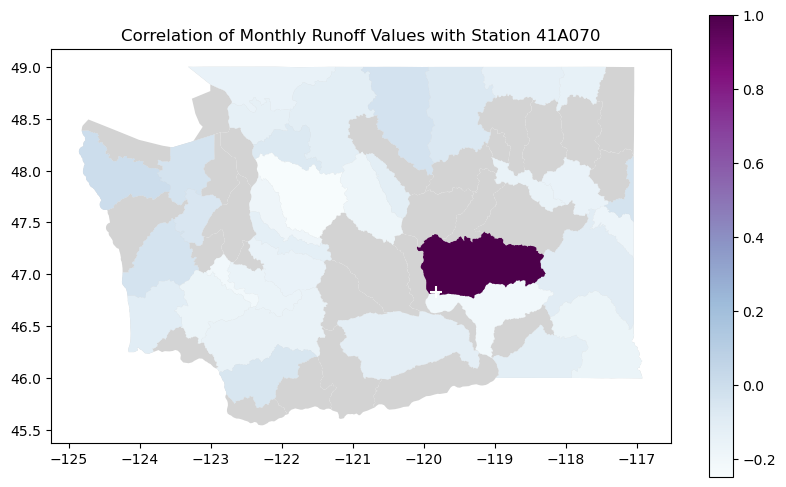

In [43]:
stationcorr('s41A070')

Text(0.5, 1.0, 'Runoff')

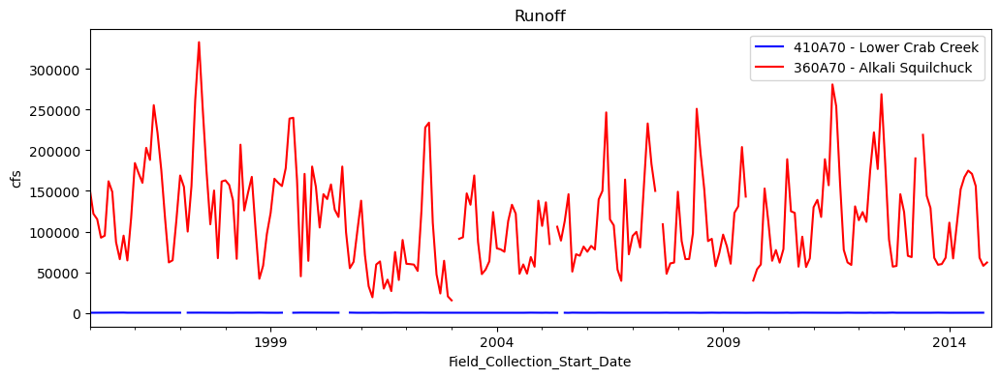

In [44]:
plt.figure(figsize=(12,4))
runoff['s41A070'].loc[((runoff.index >= '1995-01-01') & (runoff.index < '2015-01-01'))].plot(label='410A70 - Lower Crab Creek', color='blue')
runoff['s36A070'].loc[((runoff.index >= '1995-01-01') & (runoff.index < '2015-01-01'))].plot(label='360A70 - Alkali Squilchuck', color='red')
plt.legend()
plt.ylabel('cfs')
plt.title('Runoff')

In [45]:
#Running this cell will run the stationcorr function for all stations!
#runoff.columns
#for x in runoff.columns:
 #   stationcorr(x)

### Conclusion
Based on this initial analysis of runoff correlation across measurement stations in Washington, we can assume a degree of spatial correlation for river runoff in nearby watersheds.

The initial project proposal also suggested looking at the changes in runoff over time. However, calculation of decadal runoff means for each station, as well as a visual analysis of runoff time series, do not show any noteworthy changes since the 1970's. Further research may consider looking at flooding events or correlation with precipitation to better understand the factors affecting runoff and how these may be changing.

Additionally, the correlation analysis could be further expanded upon by considering certain extremely high or low runoff events, bringing in data from more stations and other variables (i.e. precipitation), and comparing runoff at different stations along the same river.